In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/car-object-detection/data/sample_submission.csv
/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv
/kaggle/input/car-object-detection/data/testing_images/vid_5_26420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31520.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29420.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_31720.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_26560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_27840.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_28360.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29560.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_29020.jpg
/kaggle/input/car-object-detection/data/testing_images/vid_5_30720.jpg
/kaggle/

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 898.5/898.5 kB 21.7 MB/s eta 0:00:0000:01


In [3]:
from ultralytics import YOLO
import os
import random
import shutil
import numpy as np
import pandas as pd
import cv2
import yaml
import matplotlib.pyplot as plt
import glob
from sklearn.model_selection import train_test_split

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [4]:
DIR = "/kaggle/working/datasets/cars/"
IMAGES = DIR +"images/"
LABELS = DIR +"labels/"

TRAIN = "/kaggle/input/car-object-detection/data/training_images"
TEST = "/kaggle/input/car-object-detection/data/testing_images"

In [5]:
df = pd.read_csv("/kaggle/input/car-object-detection/data/train_solution_bounding_boxes (1).csv")
df.head()

,image,xmin,ymin,xmax,ymax
0,vid_4_1000.jpg,281.259045,187.035071,327.727931,223.225547
1,vid_4_10000.jpg,15.163531,187.035071,120.329957,236.430180
2,vid_4_10040.jpg,239.192475,176.764801,361.968162,236.430180
3,vid_4_10020.jpg,496.483358,172.363256,630.020260,231.539575
4,vid_4_10060.jpg,16.630970,186.546010,132.558611,238.386422


In [6]:
files = list(df.image.unique())
files_train, files_valid = train_test_split(files, test_size = 0.2)

In [7]:
os.makedirs(IMAGES+"train", exist_ok=True)
os.makedirs(LABELS+"train", exist_ok=True)
os.makedirs(IMAGES+"valid", exist_ok=True)
os.makedirs(LABELS+"valid", exist_ok=True)

In [8]:
train_filename = set(files_train)
valid_filename = set(files_valid)
for file in glob.glob(TRAIN+'/*'):
    fname =os.path.basename(file)
    if fname in train_filename:
        shutil.copy(file,IMAGES+'train')
    elif fname in valid_filename:
        shutil.copy(file,IMAGES+'valid')

In [9]:
for _, row in df.iterrows():
    image_file = row['image']
    class_id = "0"
    x = row['xmin']
    y = row['ymin']
    width = row['xmax'] - row['xmin']
    height = row['ymax'] - row['ymin']
    x_center = x + (width / 2)
    y_center = y + (height / 2)
    x_center /= 676
    y_center /= 380
    width /= 676
    height /= 380

    if image_file in train_filename:
        annotation_file = os.path.join(LABELS) + "train/" + image_file.replace('.jpg', '.txt')
    else:
        annotation_file = os.path.join(LABELS) + "valid/" + image_file.replace('.jpg', '.txt')

    with open(annotation_file, 'a') as ann_file:
        ann_file.write(f"{class_id} {x_center} {y_center} {width} {height}\n")

In [10]:
%%writefile dataset.yaml
# Path
path: ./cars
train: images/train
val: images/valid

# Classes
nc: 1
names: ['car']

Writing dataset.yaml


In [11]:
model = YOLO('yolov8m.pt')
model.train(data="dataset.yaml", epochs=5, batch=32)

100%|██████████| 49.7M/49.7M [00:00<00:00, 281MB/s]


Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=dataset.yaml, epochs=5, time=None, patience=100, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_width=No

100%|██████████| 755k/755k [00:00<00:00, 36.8MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

train: Scanning /kaggle/working/datasets/cars/labels/train... 284 images, 0 backgrounds, 0 corrupt: 100%|██████████| 284/284 [00:00<00:00, 842.97it/s]

train: New cache created: /kaggle/working/datasets/cars/labels/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/datasets/cars/labels/valid... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<00:00, 966.15it/s]

val: New cache created: /kaggle/working/datasets/cars/labels/valid.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs/detect/train
Starting training for 5 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/5         0G      1.662      1.942      1.386         66        640: 100%|██████████| 9/9 [18:33<00:00, 123.68s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:49<00:00, 24.82s/it]

                   all         71        121      0.908      0.868      0.942      0.581



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/5         0G      1.309     0.8274      1.172         74        640: 100%|██████████| 9/9 [18:18<00:00, 122.08s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:50<00:00, 25.42s/it]

                   all         71        121      0.117      0.843      0.117     0.0752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/5         0G      1.235     0.7219      1.162         74        640: 100%|██████████| 9/9 [18:23<00:00, 122.60s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:49<00:00, 24.71s/it]

                   all         71        121      0.929      0.826      0.898      0.525



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/5         0G      1.188     0.6203      1.131        102        640: 100%|██████████| 9/9 [18:22<00:00, 122.45s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:49<00:00, 24.54s/it]

                   all         71        121      0.964      0.942      0.983      0.627



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/5         0G      1.188      0.561      1.125         78        640: 100%|██████████| 9/9 [18:12<00:00, 121.35s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [01:00<00:00, 30.01s/it]

                   all         71        121      0.964      0.959      0.986      0.648



5 epochs completed in 1.609 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:47<00:00, 23.65s/it]


                   all         71        121      0.963      0.959      0.986      0.647
Speed: 3.1ms preprocess, 655.9ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7cb4aeb5cbb0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

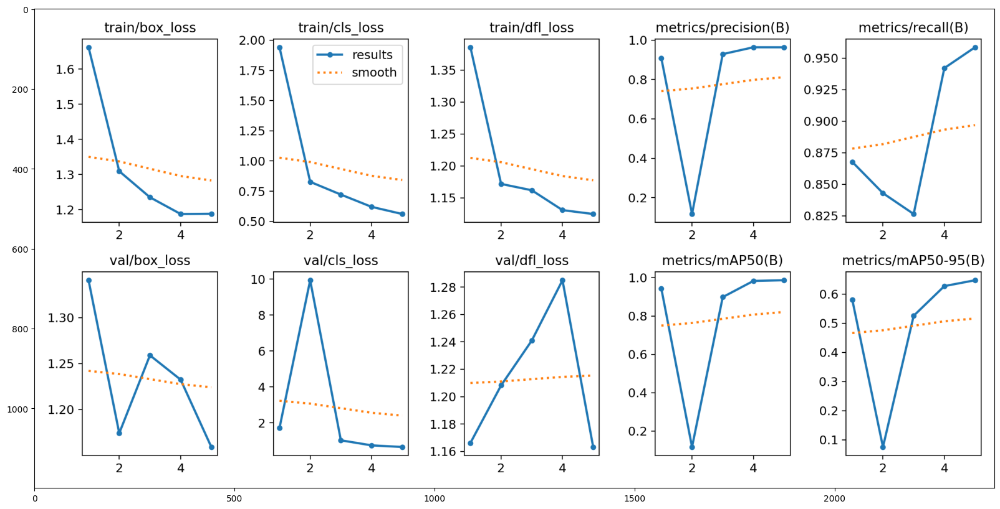

In [12]:
plt.figure(figsize=(20, 10))
plt.imshow(plt.imread('/kaggle/working/runs/detect/train/results.png'))

In [13]:
metrics=model.val()

Ultralytics 8.3.40 🚀 Python-3.10.14 torch-2.4.0+cpu CPU (Intel Xeon 2.20GHz)
Model summary (fused): 218 layers, 25,840,339 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/datasets/cars/labels/valid.cache... 71 images, 0 backgrounds, 0 corrupt: 100%|██████████| 71/71 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 3/3 [00:48<00:00, 16.14s/it]


                   all         71        121      0.963      0.959      0.986      0.647
Speed: 2.5ms preprocess, 666.7ms inference, 0.0ms loss, 0.8ms postprocess per image
Results saved to runs/detect/train2


In [14]:
#print(f"Mean Average Precision @.5:.95 : {metrics.box.map}")
print(f"Mean Average Precision @ .50   : {metrics.box.map50}")
#print(f"Mean Average Precision @ .70   : {metrics.box.map75}")

Mean Average Precision @ .50   : 0.98588607713817


In [15]:
model = YOLO('./runs/detect/train/weights/last.pt')
ret = model("/kaggle/input/car-object-detection/data/testing_images",save=True, conf=0.2, iou=0.5)


image 1/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25100.jpg: 384x640 (no detections), 631.7ms
image 2/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25120.jpg: 384x640 (no detections), 582.8ms
image 3/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25140.jpg: 384x640 (no detections), 581.6ms
image 4/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25160.jpg: 384x640 (no detections), 597.9ms
image 5/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25180.jpg: 384x640 (no detections), 619.1ms
image 6/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25200.jpg: 384x640 (no detections), 588.2ms
image 7/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25220.jpg: 384x640 (no detections), 593.6ms
image 8/175 /kaggle/input/car-object-detection/data/testing_images/vid_5_25240.jpg: 384x640 (no detections), 593.9ms
image 9/175 /kaggle/input/car-object-detection/data/testing_ima

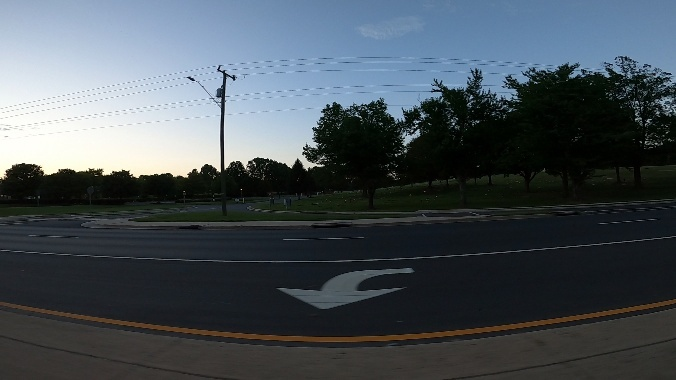

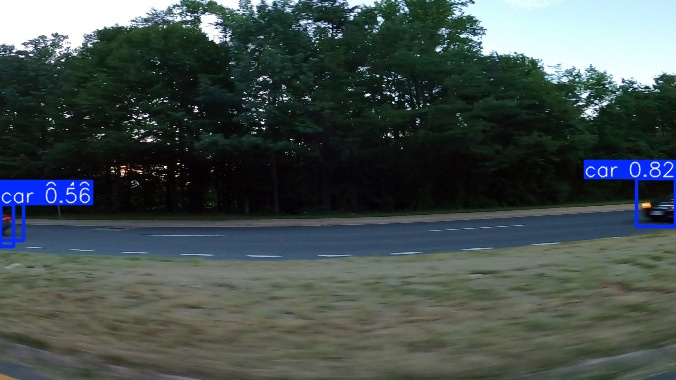

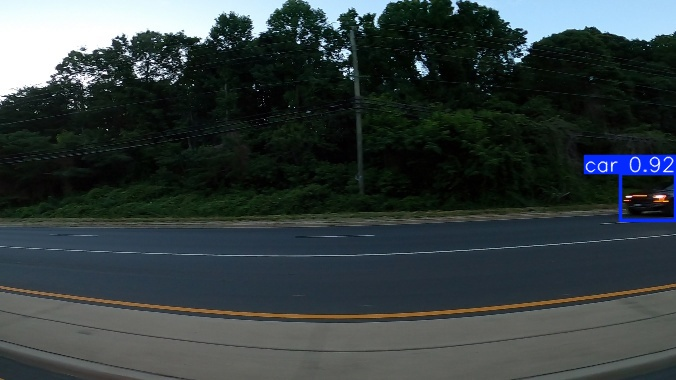

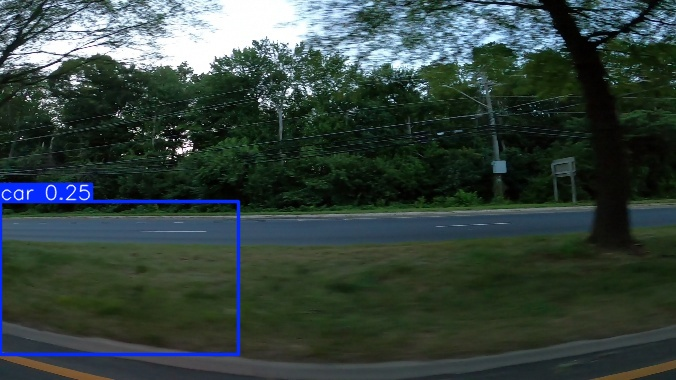

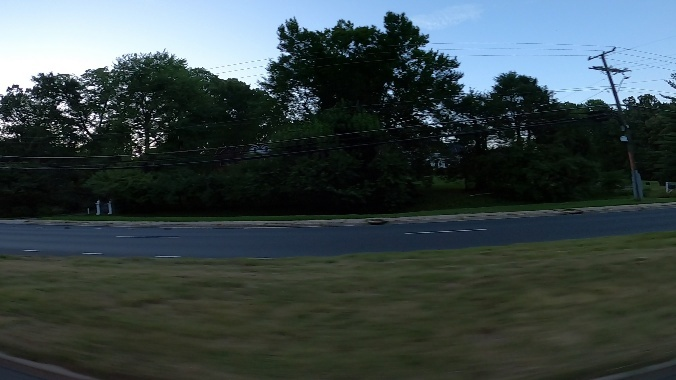

...

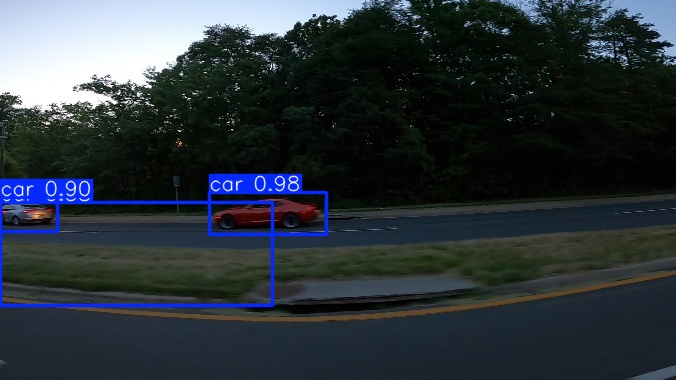

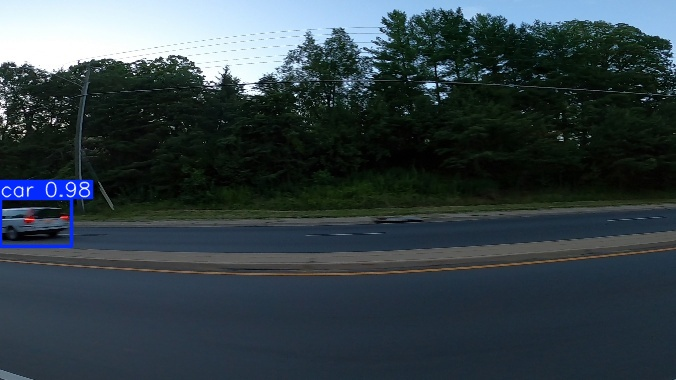

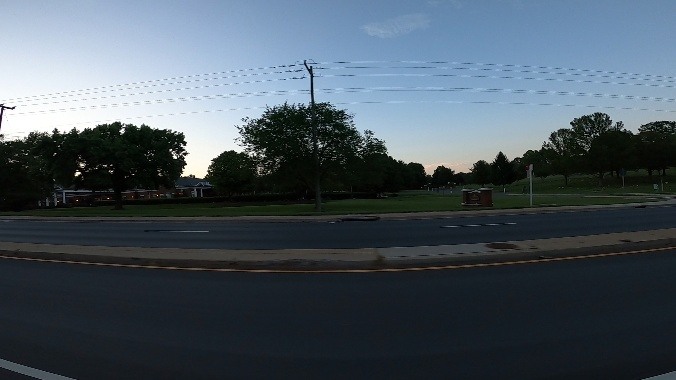

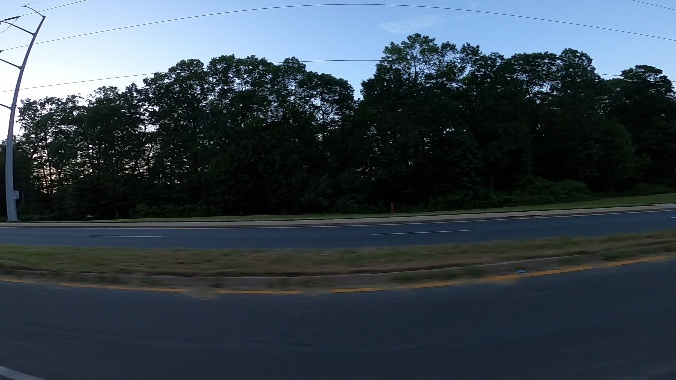

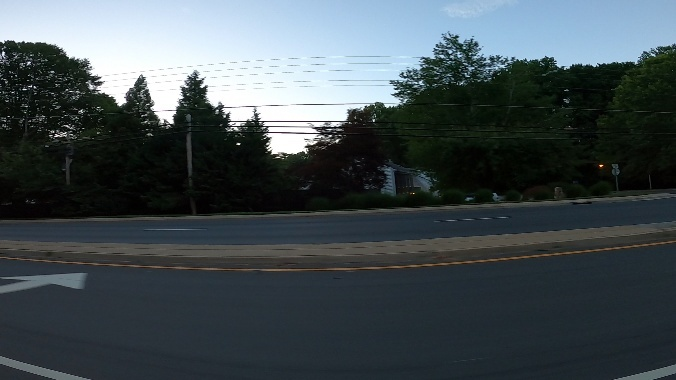

In [18]:
from IPython.display import Image

files = glob.glob("./runs/detect/predict/*")
for i in range(0, 40, 3):
    img = Image(files[i])
    display(img)


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12480.jpg: 384x640 2 cars, 596.3ms
Speed: 2.7ms preprocess, 596.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


<Figure size 2000x1000 with 0 Axes>

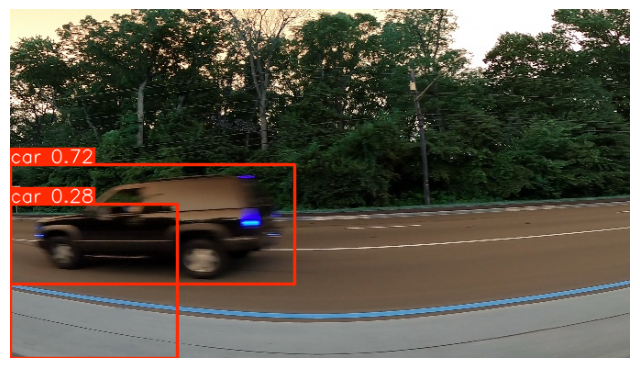


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1880.jpg: 384x640 3 cars, 598.7ms
Speed: 2.2ms preprocess, 598.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


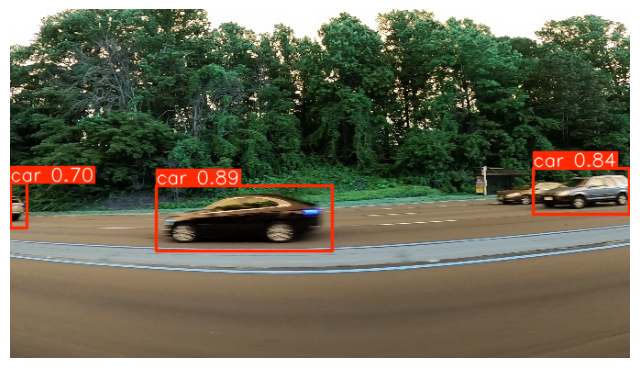


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11900.jpg: 384x640 1 car, 601.1ms
Speed: 3.1ms preprocess, 601.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


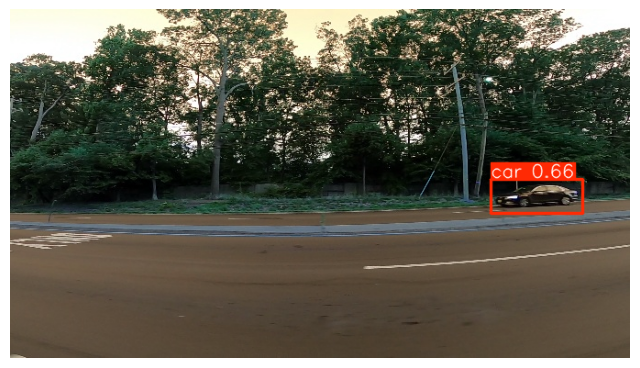


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_26380.jpg: 384x640 5 cars, 576.3ms
Speed: 3.1ms preprocess, 576.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


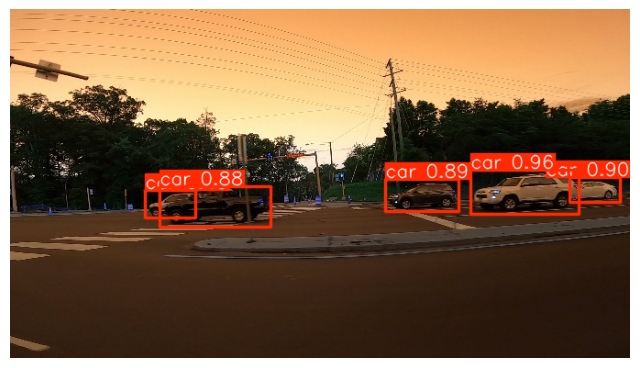


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_19880.jpg: 384x640 1 car, 578.9ms
Speed: 3.2ms preprocess, 578.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


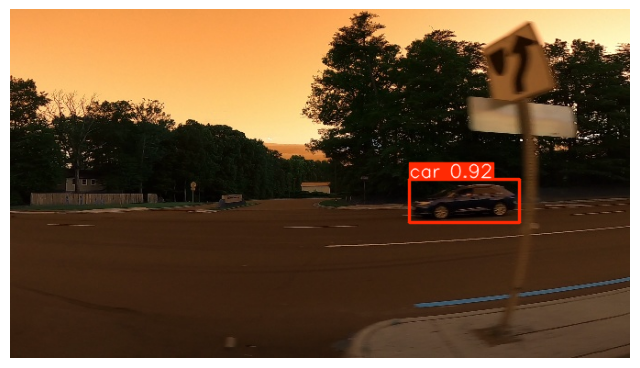


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1780.jpg: 384x640 2 cars, 579.6ms
Speed: 3.2ms preprocess, 579.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


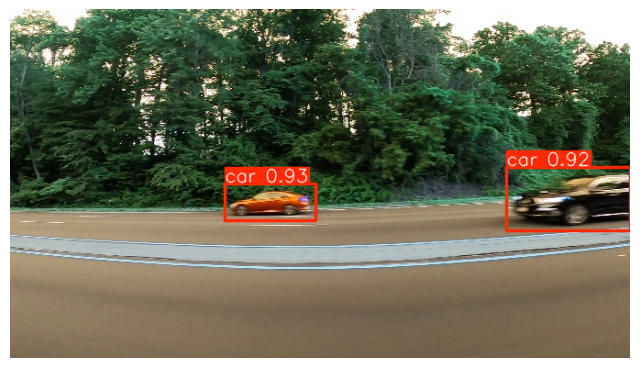


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_15040.jpg: 384x640 1 car, 577.6ms
Speed: 3.1ms preprocess, 577.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


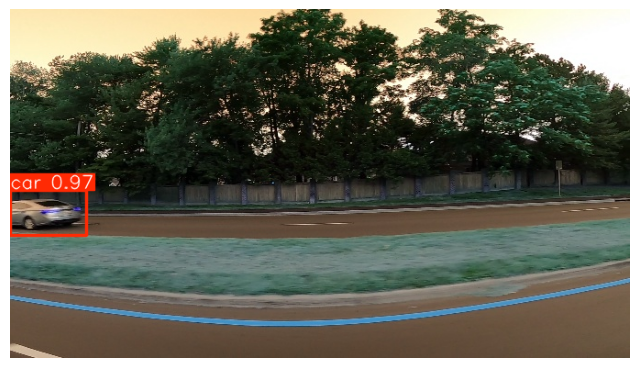


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9020.jpg: 384x640 1 car, 595.9ms
Speed: 2.2ms preprocess, 595.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


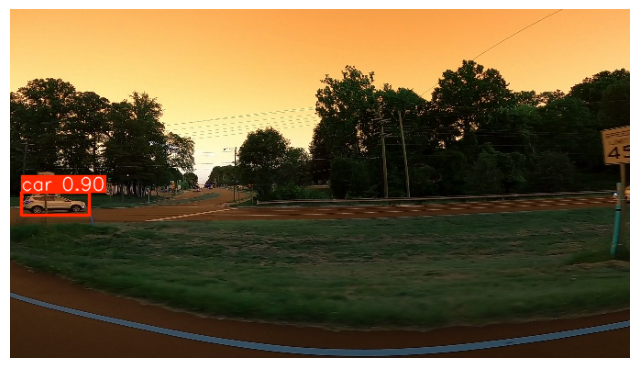


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17060.jpg: 384x640 1 car, 588.7ms
Speed: 2.2ms preprocess, 588.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


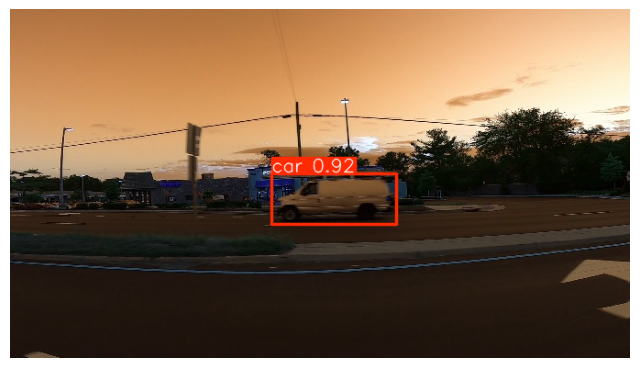


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_19060.jpg: 384x640 1 car, 596.8ms
Speed: 2.2ms preprocess, 596.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


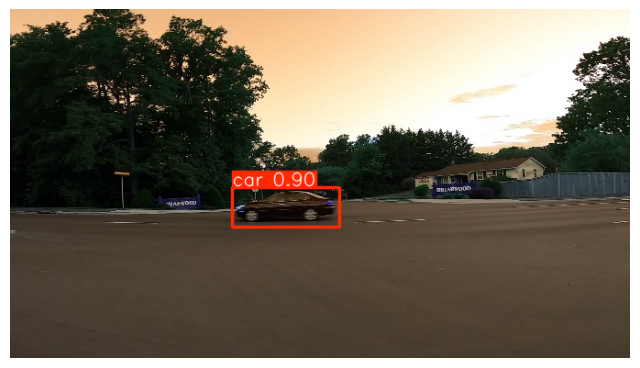


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_960.jpg: 384x640 2 cars, 580.0ms
Speed: 3.3ms preprocess, 580.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


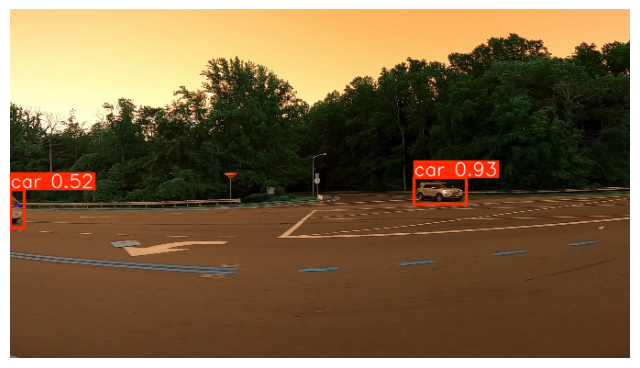


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_30020.jpg: 384x640 2 cars, 598.4ms
Speed: 2.3ms preprocess, 598.4ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


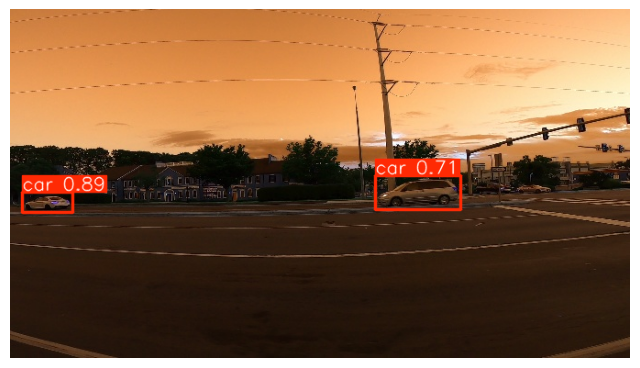


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12180.jpg: 384x640 3 cars, 582.3ms
Speed: 3.2ms preprocess, 582.3ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


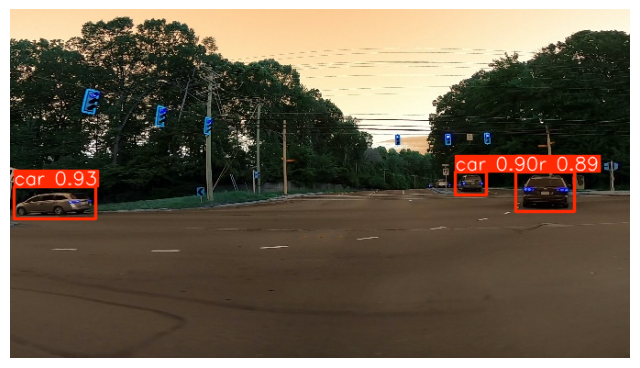


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_8960.jpg: 384x640 1 car, 603.9ms
Speed: 2.3ms preprocess, 603.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


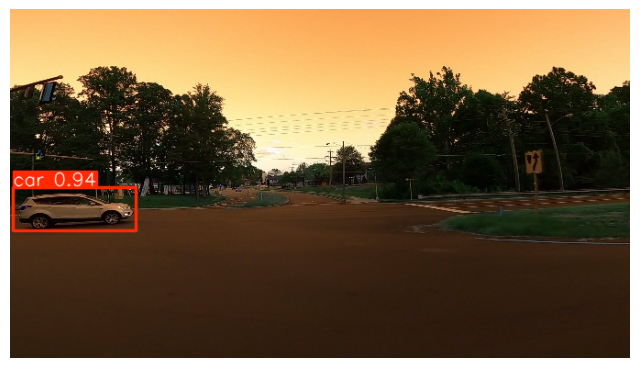


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_6440.jpg: 384x640 3 cars, 608.1ms
Speed: 2.2ms preprocess, 608.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


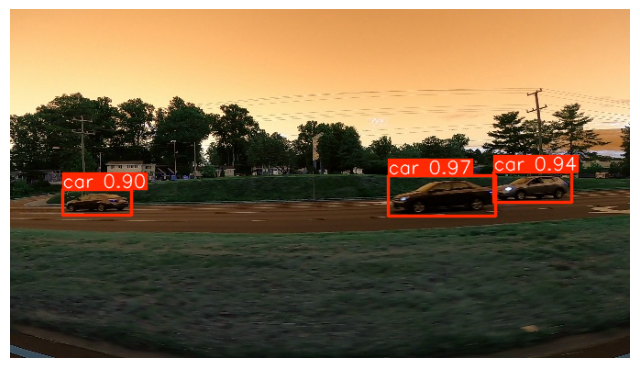


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1980.jpg: 384x640 4 cars, 575.7ms
Speed: 3.2ms preprocess, 575.7ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


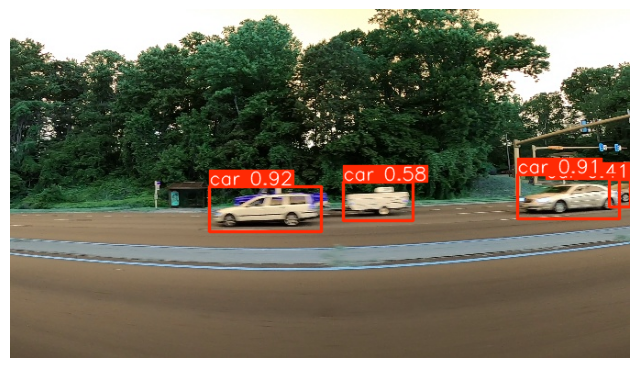


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21440.jpg: 384x640 1 car, 577.3ms
Speed: 3.3ms preprocess, 577.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


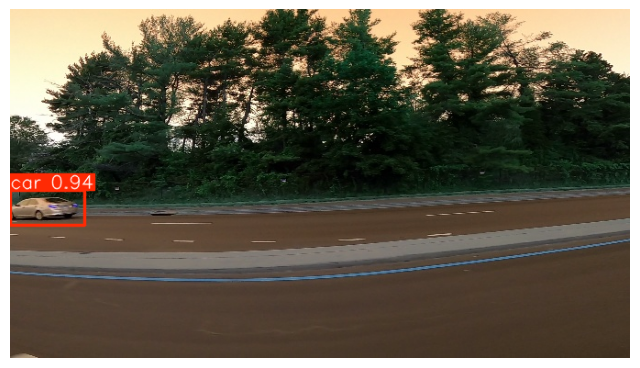


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_1020.jpg: 384x640 1 car, 576.9ms
Speed: 3.0ms preprocess, 576.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


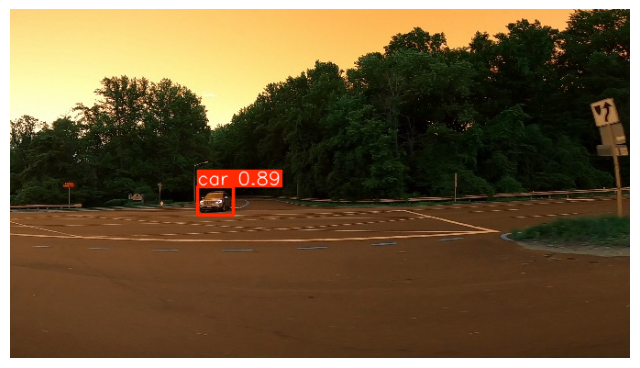


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_16180.jpg: 384x640 1 car, 587.5ms
Speed: 2.2ms preprocess, 587.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


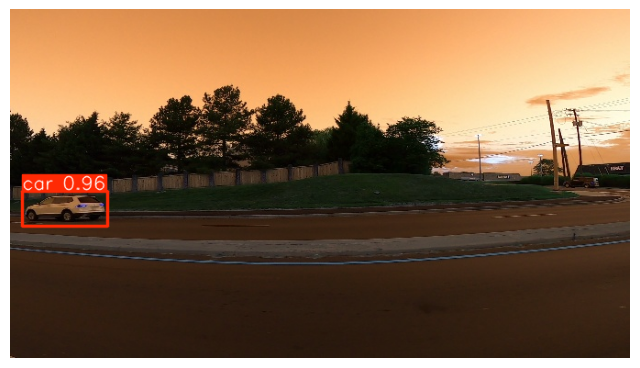


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_3520.jpg: 384x640 1 car, 589.0ms
Speed: 2.3ms preprocess, 589.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


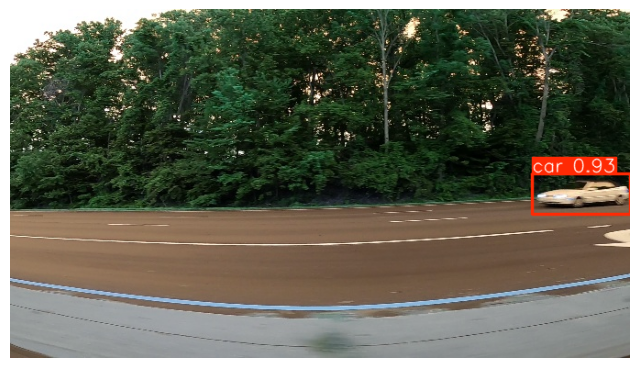


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_16040.jpg: 384x640 1 car, 576.8ms
Speed: 3.2ms preprocess, 576.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


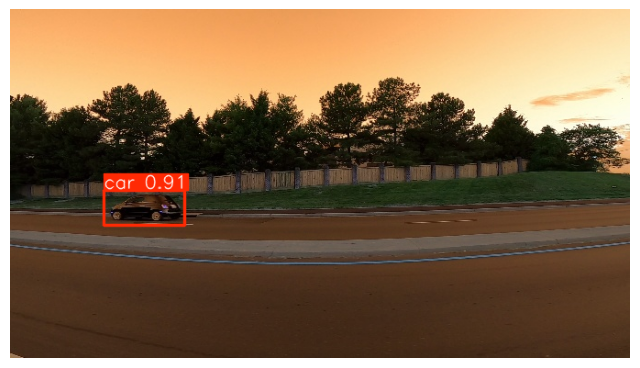


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17160.jpg: 384x640 2 cars, 591.8ms
Speed: 2.3ms preprocess, 591.8ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


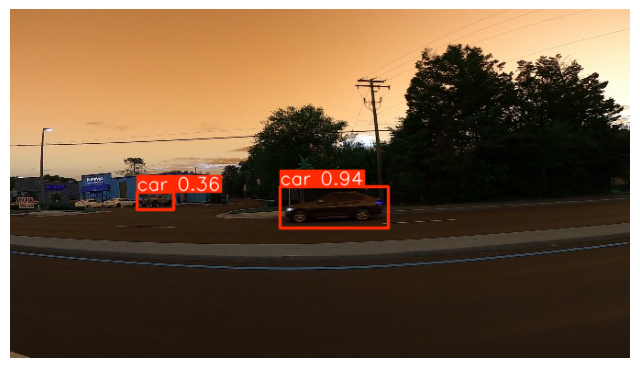


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_720.jpg: 384x640 2 cars, 585.1ms
Speed: 3.3ms preprocess, 585.1ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


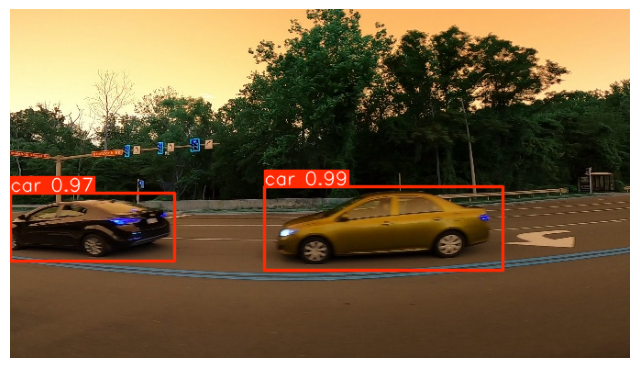


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_11380.jpg: 384x640 1 car, 595.6ms
Speed: 2.4ms preprocess, 595.6ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


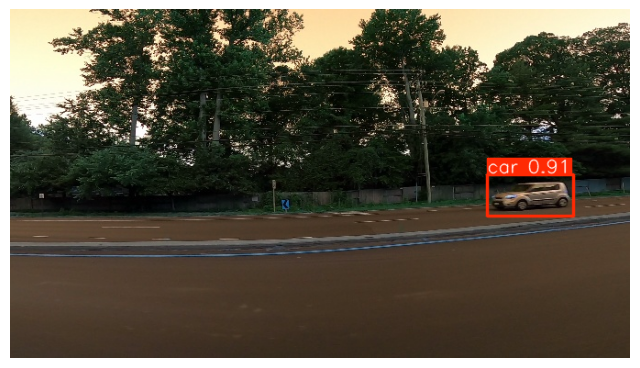


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21520.jpg: 384x640 1 car, 598.7ms
Speed: 3.1ms preprocess, 598.7ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


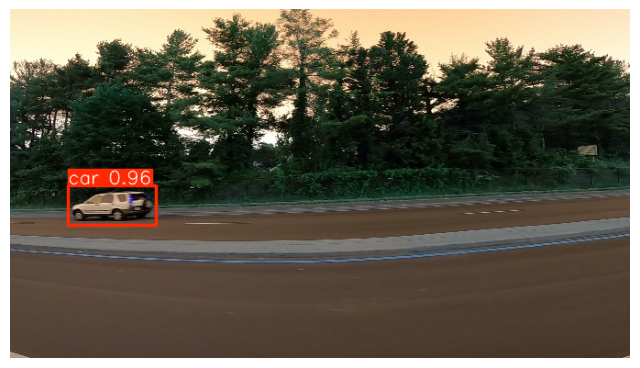


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21160.jpg: 384x640 1 car, 580.6ms
Speed: 3.2ms preprocess, 580.6ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


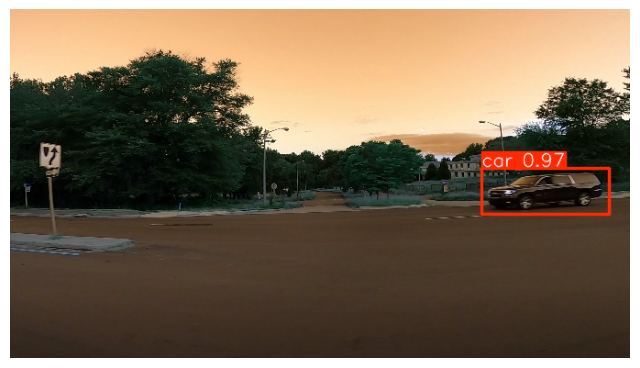


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_13760.jpg: 384x640 3 cars, 610.9ms
Speed: 3.2ms preprocess, 610.9ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


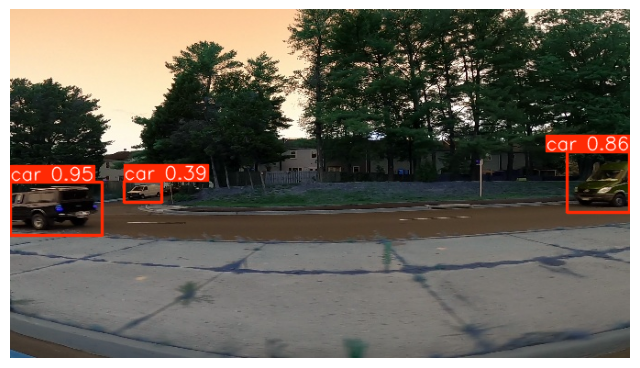


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9900.jpg: 384x640 1 car, 599.1ms
Speed: 2.2ms preprocess, 599.1ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


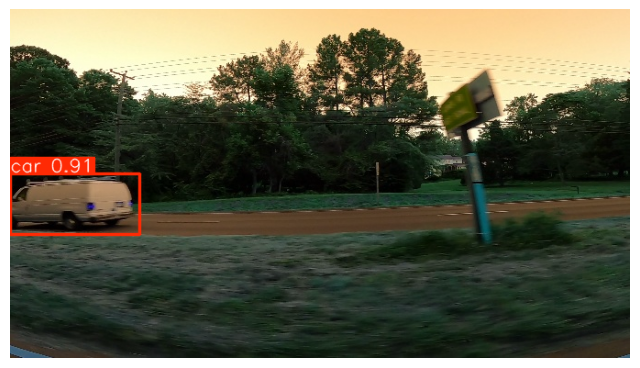


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21480.jpg: 384x640 2 cars, 611.2ms
Speed: 2.3ms preprocess, 611.2ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


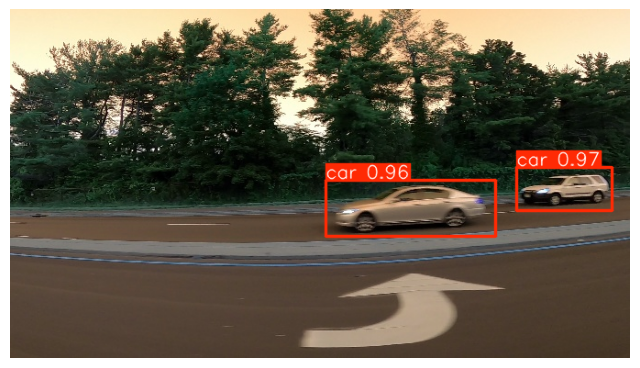


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17320.jpg: 384x640 1 car, 654.2ms
Speed: 3.1ms preprocess, 654.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


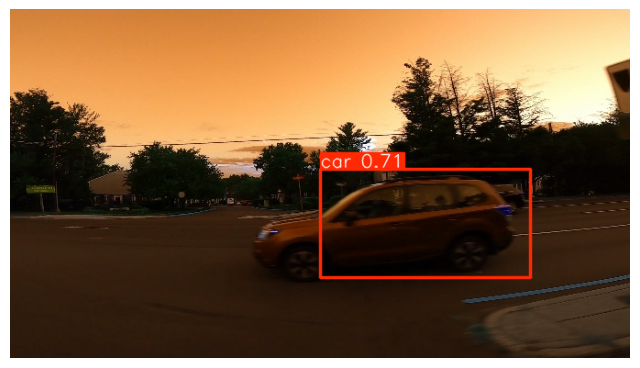


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_12160.jpg: 384x640 3 cars, 593.5ms
Speed: 10.6ms preprocess, 593.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


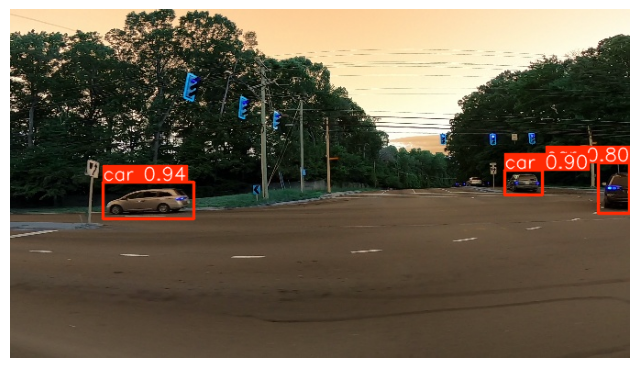


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_22640.jpg: 384x640 1 car, 578.0ms
Speed: 3.1ms preprocess, 578.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


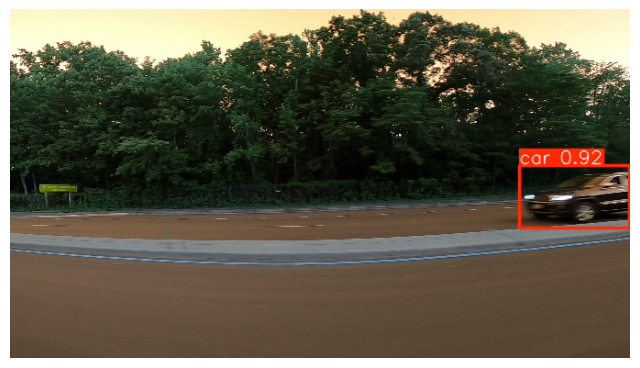


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9060.jpg: 384x640 2 cars, 588.5ms
Speed: 3.5ms preprocess, 588.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)


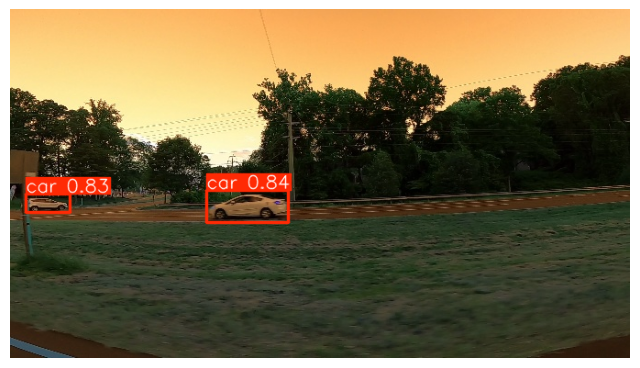


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_2060.jpg: 384x640 3 cars, 586.2ms
Speed: 2.2ms preprocess, 586.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


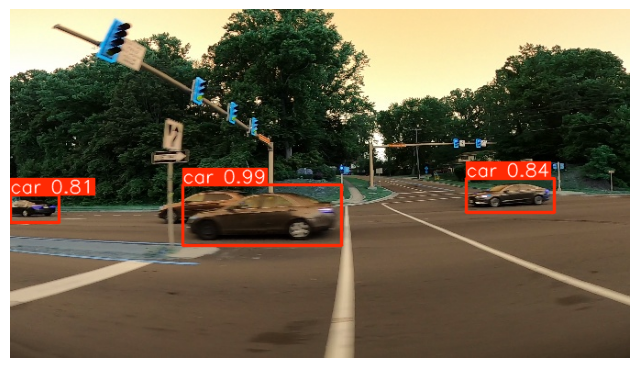


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_9280.jpg: 384x640 3 cars, 588.1ms
Speed: 2.3ms preprocess, 588.1ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


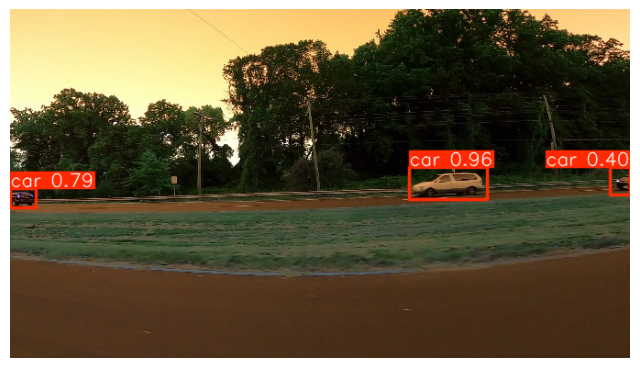


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_21500.jpg: 384x640 2 cars, 579.9ms
Speed: 3.3ms preprocess, 579.9ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


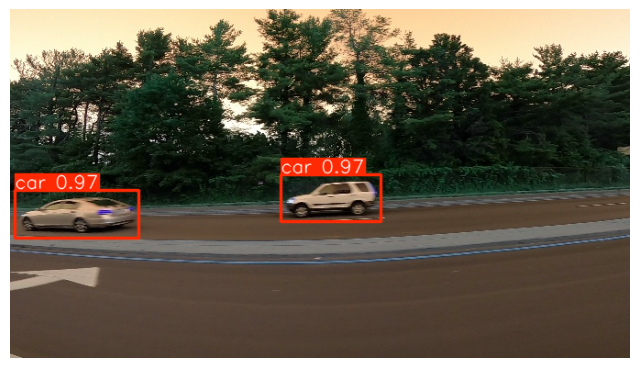


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_700.jpg: 384x640 2 cars, 590.2ms
Speed: 3.3ms preprocess, 590.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)


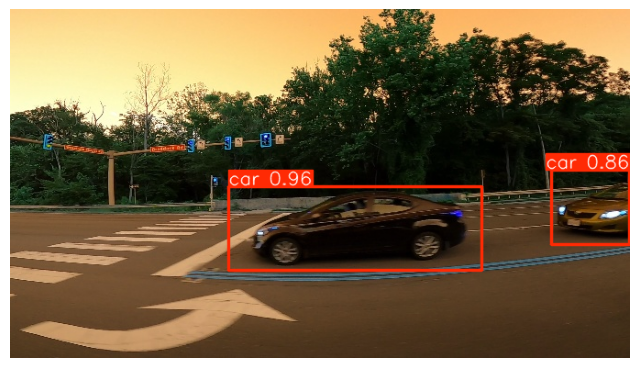


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_14360.jpg: 384x640 1 car, 607.7ms
Speed: 2.3ms preprocess, 607.7ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)


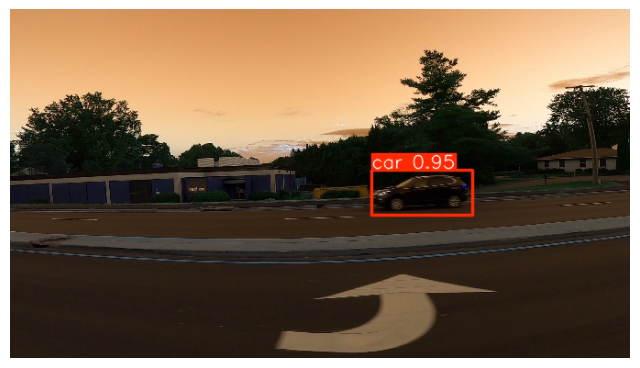


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_17400.jpg: 384x640 1 car, 577.3ms
Speed: 3.2ms preprocess, 577.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


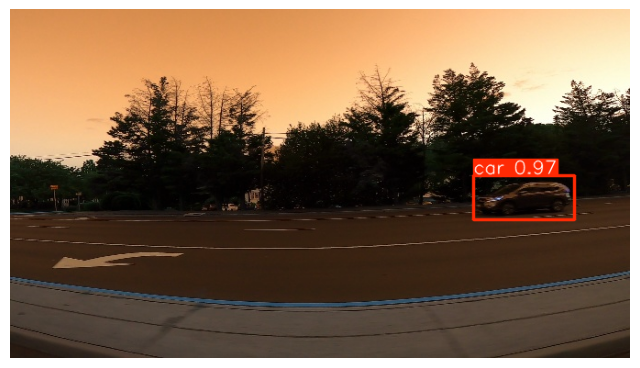


image 1/1 /kaggle/working/datasets/cars/images/valid/vid_4_22580.jpg: 384x640 1 car, 580.0ms
Speed: 3.3ms preprocess, 580.0ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)


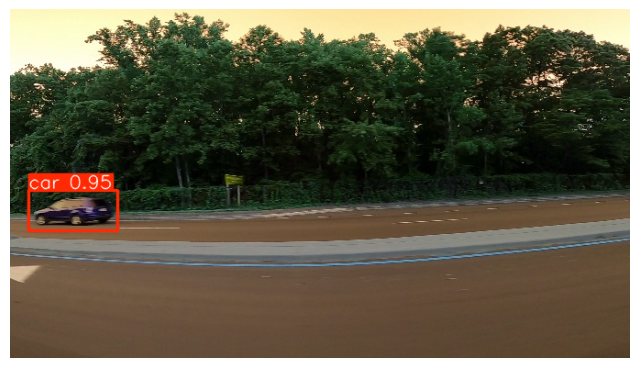

In [19]:
image_dir = "/kaggle/working/datasets/cars/images/valid"
plt.figure(figsize=(20,10))
all_images = os.listdir(image_dir)
selected_images = all_images[:40]

for img_name in selected_images:
    img_path = os.path.join(image_dir, img_name)
    results = model.predict(img_path)
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    for result in results:
        plotted_img = result.plot()
        plt.figure(figsize=(8, 6))
        plt.imshow(plotted_img)
        plt.axis('off')
        plt.show()